# Case study: suppressor features

In the graph of $f^{(img,12)}_{cat}$ we find a text-stream feature $f^{(txt,7)}_{dog-suppressor}$ with many **negative** outgoing edges, active on the text related to *dogs*: it actively suppresses cat features on dog prompts. We verify the mechanism with four interventions and show that reliable concept switching needs joint action on *what is present* and *what suppresses the alternative* - beyond single-feature steering.

In [1]:
import os

os.environ.setdefault("TRANSCODERS_DIR", "/path/to/transcoders")

from transcoder_circuits.replacement_model import LRMConfig
from transcoder_circuits.circuit_analysis import LRMPipeline

cfg = LRMConfig(target_layers=tuple(range(16)))
pipeline = LRMPipeline(cfg)
pipeline.initialize()
pipeline.load_transcoders()
pipe, transcoders = pipeline.pipe, pipeline.transcoders

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

i_cat_sanity: 5 seeds | 'a cat sitting on a red couch'
    seed 0 (1/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 1 (2/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 2 (3/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 3 (4/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 4 (5/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

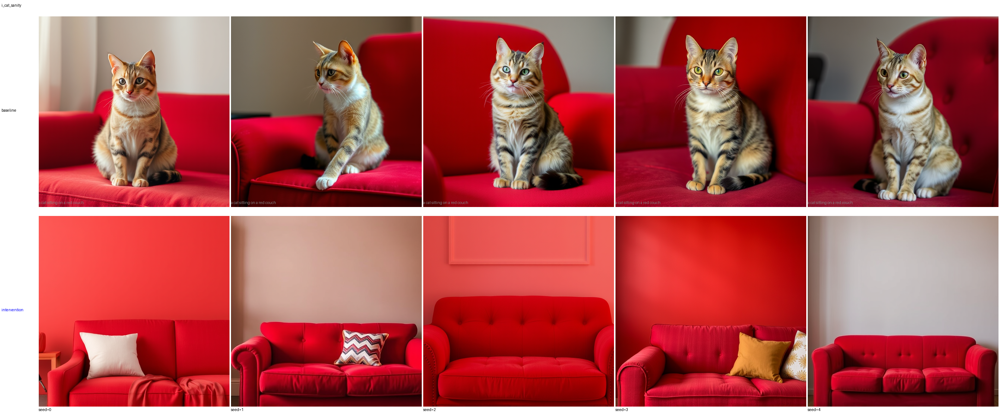

ii_invert_suppressor: 5 seeds | 'a dog sitting on a red couch'
    seed 0 (1/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 1 (2/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 2 (3/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 3 (4/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 4 (5/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

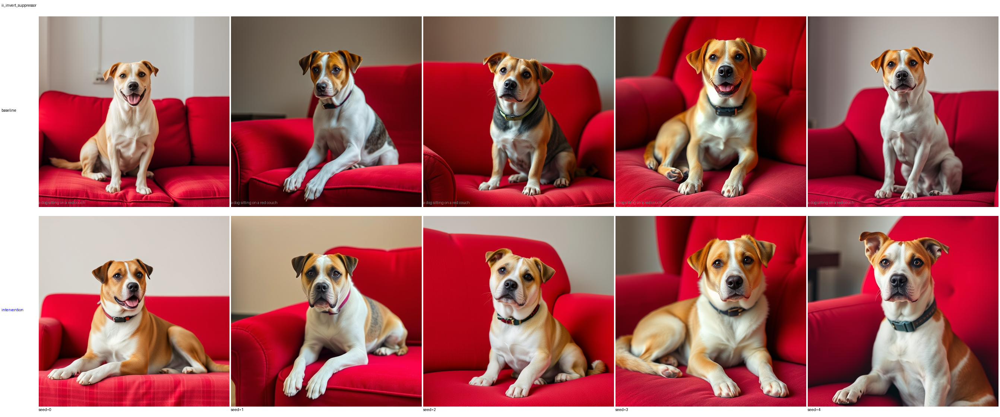

iii_suppress_dog: 5 seeds | 'a dog sitting on a red couch'
    seed 0 (1/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 1 (2/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 2 (3/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 3 (4/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 4 (5/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

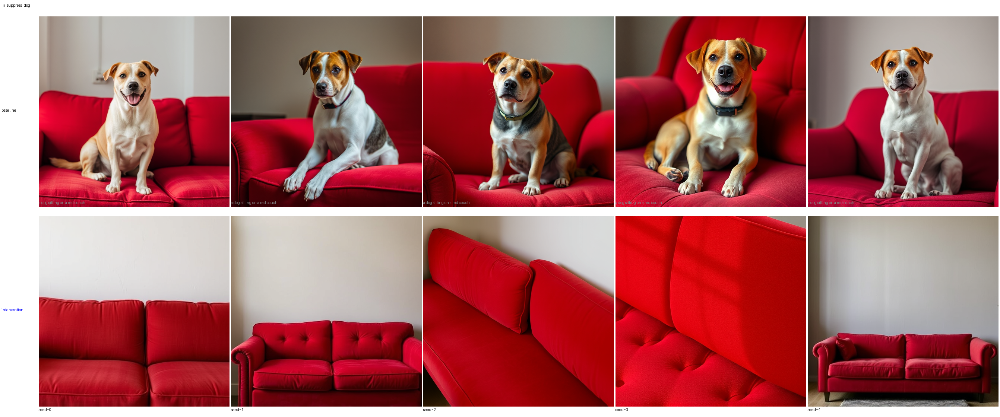

iv_combined: 5 seeds | 'a dog sitting on a red couch'
    seed 0 (1/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 1 (2/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 2 (3/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 3 (4/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

    seed 4 (5/5)


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

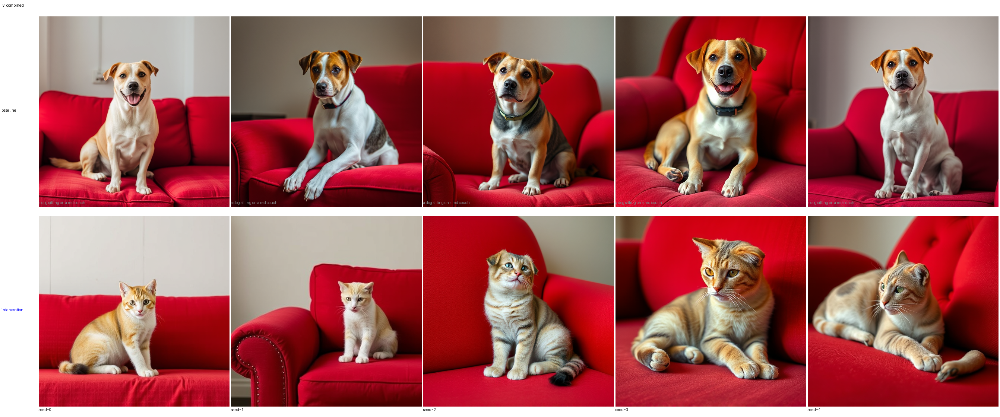

[{'seed': 0,
  'prompt': 'a cat sitting on a red couch',
  'config_name': 'i_cat_sanity',
  'baseline': <PIL.Image.Image image mode=RGB size=512x512>,
  'intervention': <PIL.Image.Image image mode=RGB size=512x512>},
 {'seed': 1,
  'prompt': 'a cat sitting on a red couch',
  'config_name': 'i_cat_sanity',
  'baseline': <PIL.Image.Image image mode=RGB size=512x512>,
  'intervention': <PIL.Image.Image image mode=RGB size=512x512>},
 {'seed': 2,
  'prompt': 'a cat sitting on a red couch',
  'config_name': 'i_cat_sanity',
  'baseline': <PIL.Image.Image image mode=RGB size=512x512>,
  'intervention': <PIL.Image.Image image mode=RGB size=512x512>},
 {'seed': 3,
  'prompt': 'a cat sitting on a red couch',
  'config_name': 'i_cat_sanity',
  'baseline': <PIL.Image.Image image mode=RGB size=512x512>,
  'intervention': <PIL.Image.Image image mode=RGB size=512x512>},
 {'seed': 4,
  'prompt': 'a cat sitting on a red couch',
  'config_name': 'i_cat_sanity',
  'baseline': <PIL.Image.Image image mode=

In [2]:
from transcoder_circuits.interventions import (
    InterventionRunner,
    InterventionConfig,
    FeatureIntervention,
)

DOG_SUPPRESSOR = [(7, "txt", 17694), (7, "txt", 17246)]  # f^(txt,7)_dog-suppressor
CAT_FEATURES = [
    (11, "txt", 15358),
    (11, "txt", 23435),
    (10, "img", 5898),
    (9, "img", 26890),
]  # cat semantic features
DOG_FEATURES = [
    (10, "txt", 29467),
    (11, "txt", 9226),
    (12, "img", 49108),
    (12, "img", 35643),
]  # dog semantic features


def intv(features, mode, scale):
    return [
        FeatureIntervention(layer=l, stream=s, feat_idx=i, mode=mode, scale=scale)
        for (l, s, i) in features
    ]


runner = InterventionRunner(pipe, transcoders)
SEEDS = [0, 1, 2, 3, 4]

experiments = [
    # (i) sanity: suppress cat on a cat prompt -> cat disappears
    InterventionConfig(
        "i_cat_sanity",
        "a cat sitting on a red couch",
        SEEDS,
        interventions=intv(CAT_FEATURES, "amplify", -60.0),
    ),
    # (ii) invert the suppressor alone on a dog prompt -> does NOT produce a cat
    InterventionConfig(
        "ii_invert_suppressor",
        "a dog sitting on a red couch",
        SEEDS,
        interventions=intv(DOG_SUPPRESSOR, "amplify", -60.0),
    ),
    # (iii) suppress dog features -> removes the dog but does not produce a cat
    InterventionConfig(
        "iii_suppress_dog",
        "a dog sitting on a red couch",
        SEEDS,
        interventions=intv(DOG_FEATURES, "amplify", -60.0),
    ),
    # (iv) combined: suppress dog AND invert the suppressor -> dog becomes a cat
    InterventionConfig(
        "iv_combined",
        "a dog sitting on a red couch",
        SEEDS,
        interventions=intv(DOG_FEATURES, "amplify", -20.0)
        + intv(DOG_SUPPRESSOR, "amplify", -30.0),
    ),
]
runner.run_experiment(experiments, output_dir="suppressor_out")